In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import timm
import matplotlib.pyplot as plt
import time
import numpy as np


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


train_dir = "archive-intel/seg_train/seg_train"
valid_dir = "archive-intel/seg_test/seg_test"

In [3]:
image_size = 224

train_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])

valid_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5],
                         std=[0.5, 0.5, 0.5])
])


In [4]:
train_data = datasets.ImageFolder(train_dir, transform=train_transform)
valid_data = datasets.ImageFolder(valid_dir, transform=valid_transform)

train_loader = DataLoader(train_data, batch_size=32, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_data, batch_size=32, shuffle=False, num_workers=4)

num_classes = len(train_data.classes)
print("Classes:", train_data.classes)


Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


• vit_base_patch16_224 is a strong ViT model.
<br>

• pretrained=True loads ImageNet weights.
<br>

• num_classes matches your classification task.
<br>

• Moves the model to GPU/CPU.
<br>


In [5]:
model = timm.create_model(
    "vit_tiny_patch16_224",
    pretrained=True,
    num_classes=num_classes
).to(device)


In [6]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=3e-4,
    weight_decay=0.01
)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=10
)


In [7]:
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total


In [8]:
def validate(model, loader, criterion):
    model.eval()
    running_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return running_loss / total, correct / total


In [1]:
import torch, gc

# Remove Python garbage
gc.collect()

# Clear CUDA memory that PyTorch cached
torch.cuda.empty_cache()

In [11]:
import time


epochs = 10
train_losses, valid_losses = [], []
train_accs, valid_accs = [], []

for epoch in range(epochs):
    start = time.time()

    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion)
    valid_loss, valid_acc = validate(model, valid_loader, criterion)

    scheduler.step()

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
    train_accs.append(train_acc)
    valid_accs.append(valid_acc)

    print(f"Epoch {epoch+1}/{epochs}")
    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")
    print(f"Valid Loss: {valid_loss:.4f}, Valid Acc: {valid_acc:.4f}")
    print(f"Time: {(time.time()-start):.2f}s")
    print("-"*40)


Epoch 1/10
Train Loss: 0.3277, Train Acc: 0.8861
Valid Loss: 0.3274, Valid Acc: 0.8813
Time: 70.37s
----------------------------------------
Epoch 2/10
Train Loss: 0.2448, Train Acc: 0.9144
Valid Loss: 0.2336, Valid Acc: 0.9170
Time: 61.45s
----------------------------------------
Epoch 3/10
Train Loss: 0.2043, Train Acc: 0.9270
Valid Loss: 0.2462, Valid Acc: 0.9117
Time: 61.64s
----------------------------------------
Epoch 4/10
Train Loss: 0.1742, Train Acc: 0.9401
Valid Loss: 0.1972, Valid Acc: 0.9350
Time: 61.56s
----------------------------------------
Epoch 5/10
Train Loss: 0.1377, Train Acc: 0.9502
Valid Loss: 0.2119, Valid Acc: 0.9237
Time: 61.60s
----------------------------------------
Epoch 6/10
Train Loss: 0.1101, Train Acc: 0.9613
Valid Loss: 0.2028, Valid Acc: 0.9353
Time: 61.59s
----------------------------------------
Epoch 7/10
Train Loss: 0.0816, Train Acc: 0.9699
Valid Loss: 0.2068, Valid Acc: 0.9323
Time: 61.77s
----------------------------------------
Epoch 8/10
Tr

In [12]:
torch.save(model.state_dict(), "vit_best_model.pth")


In [13]:
def predict_image(model, img_path, classes):
    img = Image.open(img_path).convert("RGB")
    t = valid_transform(img).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        outputs = model(t)
        _, pred = torch.max(outputs, 1)

    return classes[pred.item()]


In [18]:
from PIL import Image


predict_image(model, "archive-intel/seg_test/seg_test/forest/24143.jpg", train_data.classes)

'forest'

In [19]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_fscore_support
import pandas as pd
from PIL import Image
import os


In [20]:
def get_predictions(model, dataloader, dataset, device):
    """
    Run model on all samples in dataloader (assumes dataloader is created from `dataset`
    and shuffle=False so that order matches dataset.samples). Returns:
    - y_true (np.array of ints)
    - y_pred (np.array of ints)
    - y_prob (np.array of max probabilities)
    - all_logits (np.array of logits)
    - paths (list of image filepaths in the same order)
    """
    model.eval()
    ys_true = []
    ys_pred = []
    ys_prob = []
    logits_list = []
    paths = []

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(dataloader):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)                    # shape [B, C]
            probs = torch.softmax(outputs, dim=1)      # convert to probabilities

            max_probs, preds = torch.max(probs, dim=1)

            ys_true.extend(labels.cpu().numpy().tolist())
            ys_pred.extend(preds.cpu().numpy().tolist())
            ys_prob.extend(max_probs.cpu().numpy().tolist())
            logits_list.extend(outputs.cpu().numpy().tolist())

    # build paths list from dataset.samples (ImageFolder uses .samples)
    # dataloader must have shuffle=False so dataset.samples ordering matches loader outputs
    if hasattr(dataset, "samples"):
        paths = [p for p, _ in dataset.samples]
    else:
        # fallback: None placeholders
        paths = [None] * len(ys_true)

    return (np.array(ys_true), np.array(ys_pred),
            np.array(ys_prob), np.array(logits_list), paths)


In [26]:
import pandas as pd

# Convert _Classes object → normal Python list
classes = list(train_data.classes)

y_true, y_pred, y_conf, all_logits, img_paths = get_predictions(
    model, valid_loader, valid_data, device
)

# class names
class_names = [classes[i] for i in range(len(classes))]

results_df = pd.DataFrame({
    "image_path": img_paths,
    "true_idx": y_true,
    "pred_idx": y_pred,
    "pred_conf": y_conf
})

results_df["true_label"] = results_df["true_idx"].map(lambda x: class_names[x])
results_df["pred_label"] = results_df["pred_idx"].map(lambda x: class_names[x])
results_df["correct"] = results_df["true_idx"] == results_df["pred_idx"]

display(results_df.head())


,image_path,true_idx,pred_idx,pred_conf,true_label,pred_label,correct
0,archive-intel/seg_test/seg_test/buildings/2005...,0,0,0.999971,buildings,buildings,True
1,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999914,buildings,buildings,True
2,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999939,buildings,buildings,True
3,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999922,buildings,buildings,True
4,archive-intel/seg_test/seg_test/buildings/2007...,0,0,0.982998,buildings,buildings,True


In [27]:
# run predictions


y_true, y_pred, y_conf, all_logits, img_paths = get_predictions(model, valid_loader, valid_data, device)

# class names: if you have dict classes mapping index->name
# e.g., classes = {0:'buildings', 1:'forest', ...}
class_names = [classes[i] for i in range(len(classes))]

# results table
results_df = pd.DataFrame({
    "image_path": img_paths,
    "true_idx": y_true,
    "pred_idx": y_pred,
    "pred_conf": y_conf
})
results_df["true_label"] = results_df["true_idx"].map(lambda x: class_names[x])
results_df["pred_label"] = results_df["pred_idx"].map(lambda x: class_names[x])
results_df["correct"] = results_df["true_idx"] == results_df["pred_idx"]

# show top rows
print("Sample of results:")
display(results_df.head())


Sample of results:


,image_path,true_idx,pred_idx,pred_conf,true_label,pred_label,correct
0,archive-intel/seg_test/seg_test/buildings/2005...,0,0,0.999971,buildings,buildings,True
1,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999914,buildings,buildings,True
2,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999939,buildings,buildings,True
3,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999922,buildings,buildings,True
4,archive-intel/seg_test/seg_test/buildings/2007...,0,0,0.982998,buildings,buildings,True


In [29]:
# run predictions
y_true, y_pred, y_conf, all_logits, img_paths = get_predictions(model, valid_loader, valid_data, device)

# class names: if you have dict classes mapping index->name
# e.g., classes = {0:'buildings', 1:'forest', ...}
class_names = [classes[i] for i in range(len(classes))]

# results table
results_df = pd.DataFrame({
    "image_path": img_paths,
    "true_idx": y_true,
    "pred_idx": y_pred,
    "pred_conf": y_conf
})
results_df["true_label"] = results_df["true_idx"].map(lambda x: class_names[x])
results_df["pred_label"] = results_df["pred_idx"].map(lambda x: class_names[x])
results_df["correct"] = results_df["true_idx"] == results_df["pred_idx"]

# show top rows
print("Sample of results:")
display(results_df.head())


Sample of results:


,image_path,true_idx,pred_idx,pred_conf,true_label,pred_label,correct
0,archive-intel/seg_test/seg_test/buildings/2005...,0,0,0.999971,buildings,buildings,True
1,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999914,buildings,buildings,True
2,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999939,buildings,buildings,True
3,archive-intel/seg_test/seg_test/buildings/2006...,0,0,0.999922,buildings,buildings,True
4,archive-intel/seg_test/seg_test/buildings/2007...,0,0,0.982998,buildings,buildings,True


In [30]:
# overall accuracy
acc = (y_true == y_pred).mean()
print(f"Overall accuracy: {acc:.4f}")

# classification report (precision, recall, f1 per class)
report_dict = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

print("\nClassification report (per class):")
display(report_df)


Overall accuracy: 0.9387

Classification report (per class):


,precision,recall,f1-score,support
buildings,0.941725,0.924485,0.933025,437.000000
forest,0.987474,0.997890,0.992655,474.000000
glacier,0.912963,0.891501,0.902104,553.000000
mountain,0.907157,0.893333,0.900192,525.000000
sea,0.952290,0.978431,0.965184,510.000000
street,0.935421,0.954092,0.944664,501.000000
accuracy,0.938667,0.938667,0.938667,0.938667
macro avg,0.939505,0.939955,0.939637,3000.000000
weighted avg,0.938345,0.938667,0.938412,3000.000000


In [32]:
def top_k_accuracy_from_logits(all_logits, y_true, k=3):
    """
    all_logits: np.array shape [N, C]
    y_true: np.array shape [N]
    """
    topk = np.argsort(-all_logits, axis=1)[:, :k]  # indices of top-k preds
    hits = [1 if y_true[i] in topk[i] else 0 for i in range(len(y_true))]
    return np.mean(hits)

for k in [1, 3, 5]:
    print(f"Top-{k} accuracy: {top_k_accuracy_from_logits(all_logits, y_true, k=k):.4f}")


Top-1 accuracy: 0.9387
Top-3 accuracy: 0.9993
Top-5 accuracy: 1.0000


In [ ]:
import pandas as pd
from PIL import Image
import torch
import os


# Make sure model is in eval mode
model.eval()

image_paths = []
true_indices = []
pred_indices = []
pred_labels = []
pred_confidences = []
true_labels = []

# classes = {0: 'buildings', 1:'forest', ...}
idx_to_class = classes
class_to_idx = {v: k for k, v in classes.items()}

for path, class_index in valid_data.samples:
    img = Image.open(path).convert("RGB")
    x = transform_vit(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(x)
        probs = torch.softmax(logits, dim=1)
        pred_idx = probs.argmax(dim=1).item()
        pred_label = idx_to_class[pred_idx]
        conf = probs[0, pred_idx].item()

    image_paths.append(path)
    true_indices.append(class_index)
    true_labels.append(idx_to_class[class_index])
    pred_indices.append(pred_idx)
    pred_labels.append(pred_label)
    pred_confidences.append(conf)

# Build DataFrame
results_df = pd.DataFrame({
    "image_path": image_paths,
    "true_idx": true_indices,
    "true_label": true_labels,
    "pred_idx": pred_indices,
    "pred_label": pred_labels,
    "pred_conf": pred_confidences
})

# FIX: Correct vs Wrong (now accurate)
results_df["correct"] = results_df["true_idx"] == results_df["pred_idx"]

print("Correct predictions:", results_df["correct"].sum())
print("Wrong predictions:", (~results_df["correct"]).sum())


Correct predictions: 2816
Wrong predictions: 184


In [71]:
import matplotlib.pyplot as plt
from PIL import Image

def show_image_grid(rows=4, cols=5, kind="worst", max_images=20):
    """
    kind: 
        "worst"          -> highest confidence wrong predictions
        "random_wrong"   -> random wrong predictions
        "random_correct" -> random correct predictions
        "best"           -> highest confidence correct predictions
        "all"            -> random sample from all
    """

    n = rows * cols

    if kind == "worst":
        subset = results_df[results_df["correct"] == False] \
                 .sort_values("pred_conf", ascending=False)

    elif kind == "random_wrong":
        wrong_df = results_df[results_df["correct"] == False]
        subset = wrong_df.sample(min(max_images, len(wrong_df)))

    elif kind == "random_correct":
        correct_df = results_df[results_df["correct"] == True]
        subset = correct_df.sample(min(max_images, len(correct_df)))

    elif kind == "best":
        subset = results_df[results_df["correct"] == True] \
                 .sort_values("pred_conf", ascending=False)

    else:  # "all"
        subset = results_df.sample(min(max_images, len(results_df)))

    subset = subset.iloc[:n]  # limit to grid size

    plt.figure(figsize=(cols * 3, rows * 3))

    for i, row in enumerate(subset.itertuples()):
        img = Image.open(row.image_path).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        title_color = "green" if row.true_idx == row.pred_idx else "red"
        plt.title(
            f"GT: {row.true_label}\nPred: {row.pred_label} ({row.pred_conf:.2f})",
            fontsize=9, color=title_color
        )
        plt.axis("off")

    plt.tight_layout()
    plt.show()


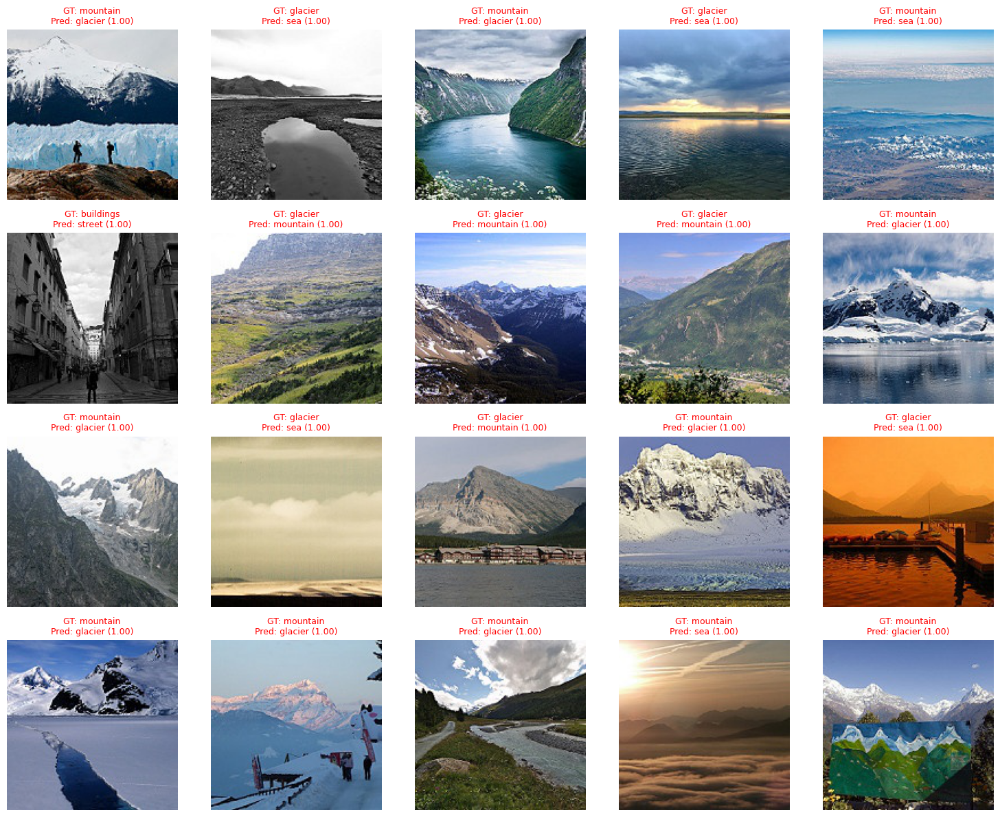

In [ ]:
#Show highest-confidence wrong predictions

show_image_grid(rows=4, cols=5, kind="worst")


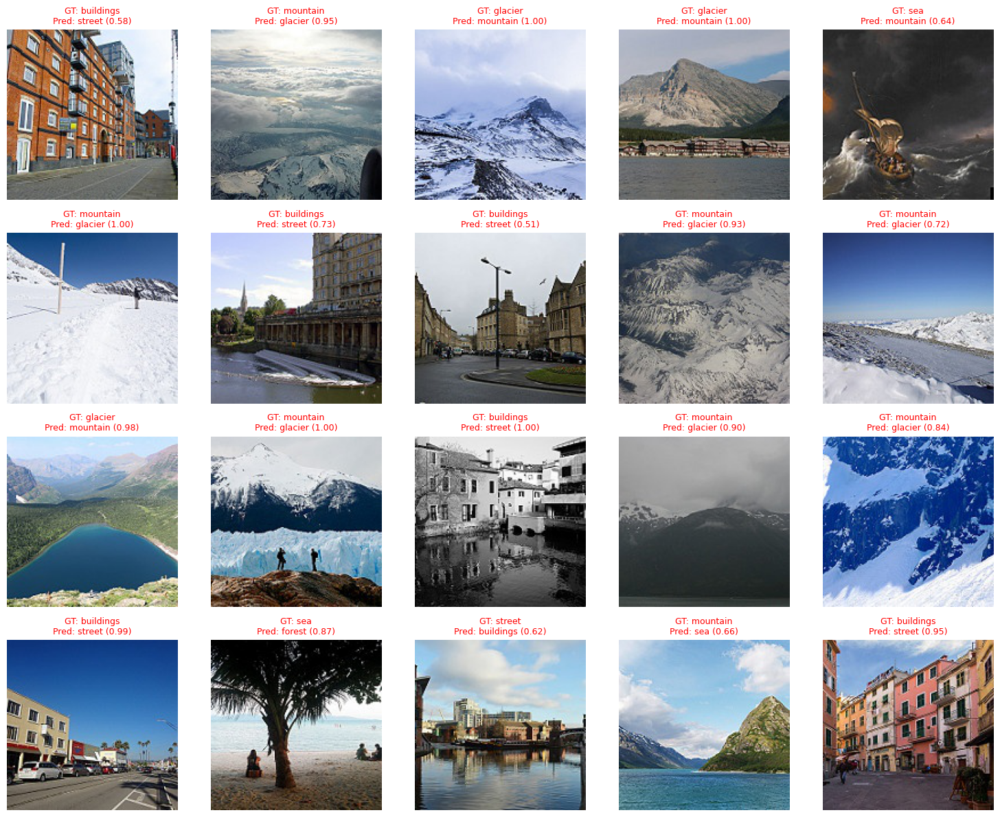

In [74]:
#Show random wrong predictions
show_image_grid(rows=4, cols=5, kind="random_wrong")


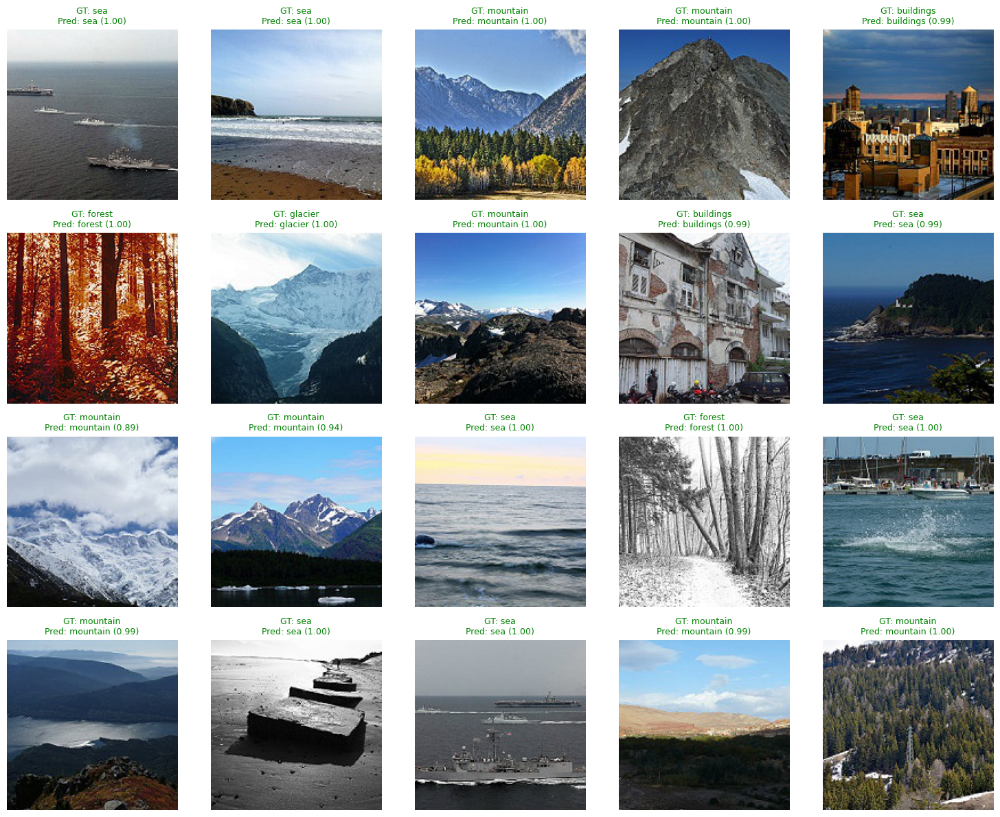

In [ ]:
#Show random correct predictions
show_image_grid(rows=4, cols=5, kind="random_correct")



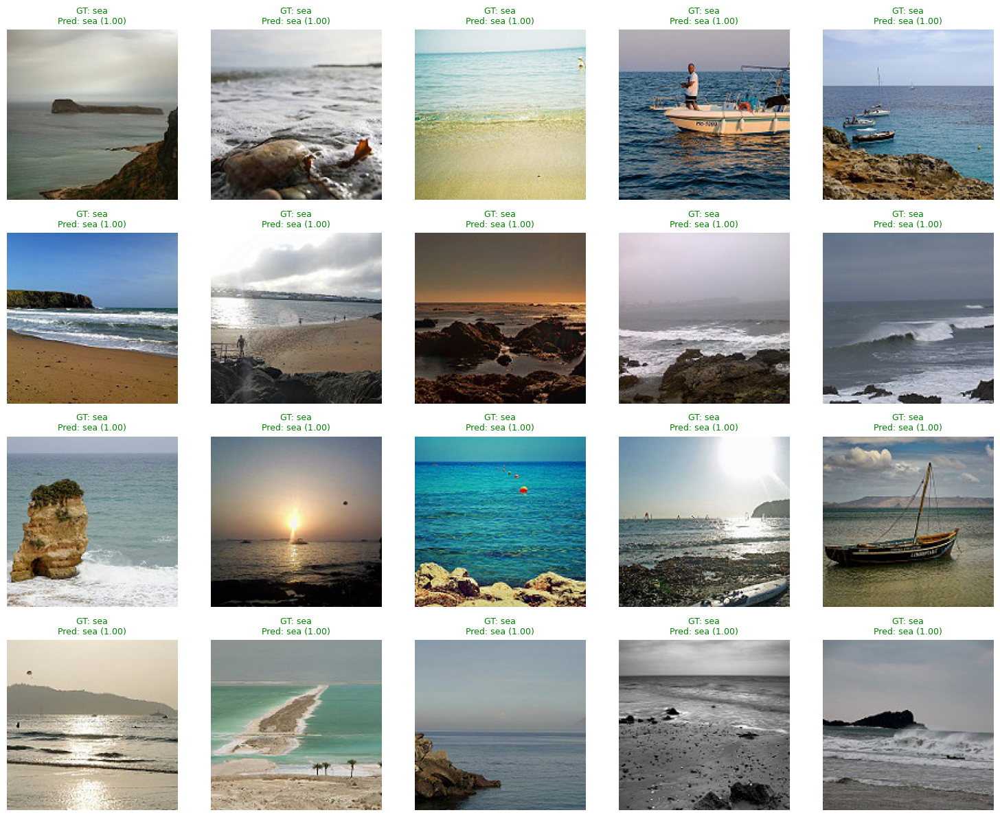

In [76]:
#Show best (most confident) correct predictions
show_image_grid(rows=4, cols=5, kind="best")


In [36]:
# assumes: valid_data = ImageFolder(...)
# classes = mapping index -> class name

image_paths = []
true_labels = []

for path, label in valid_data.samples:
    image_paths.append(path)
    true_labels.append(classes[label])


In [37]:
def predict_image(model, img_path, classes):
    img = Image.open(img_path).convert("RGB")
    t = valid_transform(img).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        outputs = model(t)
        probs = torch.softmax(outputs, dim=1)
        conf, pred = torch.max(probs, 1)

    return classes[pred.item()], conf.item()


In [38]:
import matplotlib.pyplot as plt
import math

def show_gt_vs_pred(model, image_paths, true_labels, classes, rows=4, cols=5):
    n = rows * cols
    plt.figure(figsize=(cols * 3, rows * 3))

    for i in range(n):
        img_path = image_paths[i]
        gt_label = true_labels[i]
        pred_label, conf = predict_image(model, img_path, classes)

        img = Image.open(img_path).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis('off')

        color = "green" if gt_label == pred_label else "red"
        plt.title(
            f"GT: {gt_label}\nPred: {pred_label} ({conf:.2f})",
            color=color,
            fontsize=9
        )

    plt.tight_layout()
    plt.show()


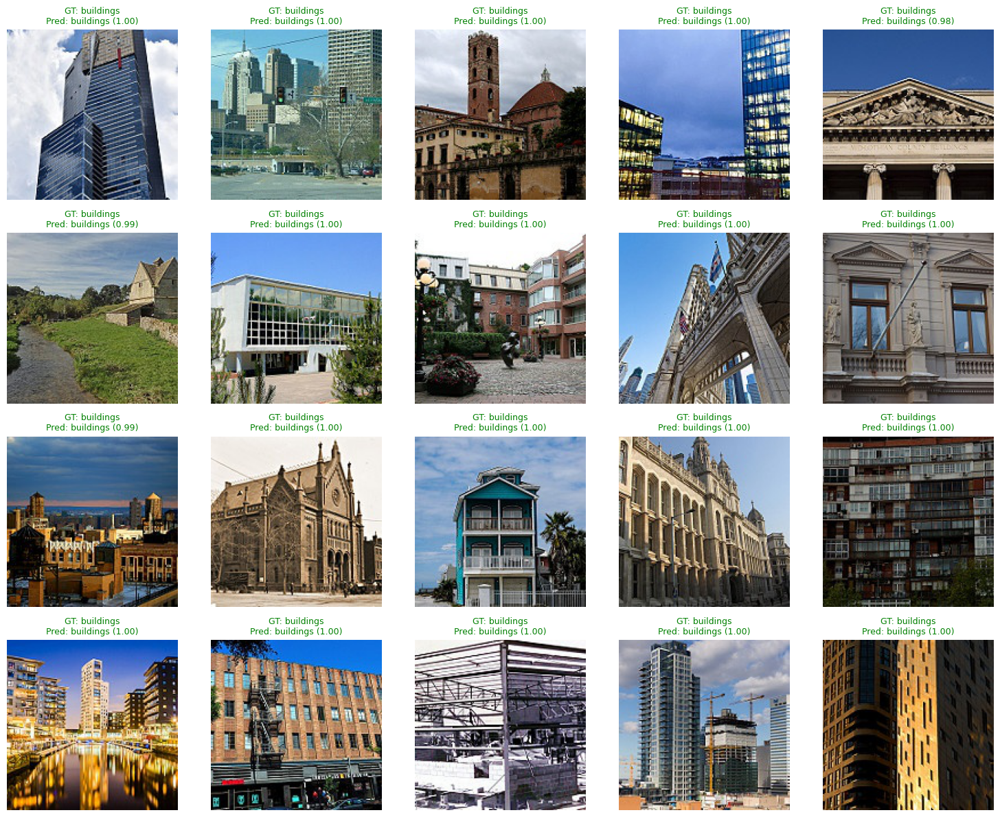

In [69]:
show_gt_vs_pred(model, image_paths, true_labels, classes, rows=4, cols=5)
